In [7]:
!pip install inference 

ERROR: Ignored the following yanked versions: 0.7.2, 0.7.6, 0.8.0, 0.8.1, 0.8.2, 0.8.4, 0.8.5, 0.8.8, 0.8.9, 0.9.0, 0.9.1, 0.9.2, 0.9.3, 0.9.4, 0.9.5, 0.9.6, 0.9.7rc2, 0.9.7, 0.9.8, 0.9.9rc23, 0.9.9, 0.9.10rc3, 0.9.10, 0.9.11rc1, 0.9.11rc2, 0.9.11, 0.9.12rc1, 0.9.12rc3, 0.9.12, 0.9.13, 0.9.14, 0.9.15rc1, 0.9.15, 0.9.16, 0.9.17
ERROR: Ignored the following versions that require a different python version: 0.10.0 Requires-Python >=3.8,<3.12; 0.11.0 Requires-Python >=3.8,<3.12; 0.11.1 Requires-Python >=3.8,<3.12; 0.11.2 Requires-Python >=3.8,<3.12; 0.12.0 Requires-Python >=3.8,<3.12; 0.12.1 Requires-Python >=3.8,<3.12; 0.13.0 Requires-Python >=3.8,<3.12; 0.14.0 Requires-Python >=3.8,<3.12; 0.14.1 Requires-Python >=3.8,<3.12; 0.15.0 Requires-Python >=3.8,<3.12; 0.15.1 Requires-Python >=3.8,<3.12; 0.15.2 Requires-Python >=3.8,<3.12; 0.16.0 Requires-Python >=3.8,<3.12; 0.16.2 Requires-Python >=3.8,<3.12; 0.16.3 Requires-Python >=3.8,<3.12; 0.17.0 Requires-Python >=3.8,<3.12; 0.17.1 Requires-

In [6]:
!pip install ultralytics -q

In [8]:
# inference_with_ultralytics.py
from ultralytics import YOLO
import os

# 1) Paths
home        = os.path.expanduser("~")
weights     = f"{home}/models/jakes-loped/jakes-finder-mk1/1/weights.pt"
img_path    = f"{home}/SubwaySurfers/train_screenshots/frame_0000.jpg"

# 2) Load
model = YOLO(weights)

# 3) Infer (take the first / only result)
results = model(img_path, conf=0.5, iou=0.45)[0]

# 4a) Print JSON
#print(results.to_json())

# 4b) Or a nice summary
#print(results.summary())

# 4c) Or loop through box coords + class names
for xyxy, conf, cls in zip(
    results.boxes.xyxy.cpu().numpy(),
    results.boxes.conf.cpu().numpy(),
    results.boxes.cls.cpu().numpy()
):
    x1, y1, x2, y2 = xyxy
    name = results.names[int(cls)]
    #print(f"{name}: {conf:.2f} at [{x1:.1f},{y1:.1f},{x2:.1f},{y2:.1f}]")


WARNING ⚠️ Ultralytics settings reset to default values. This may be due to a possible problem with your settings or a recent ultralytics package update. 
View Ultralytics Settings with 'yolo settings' or at '/Users/marcus/Library/Application Support/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.

image 1/1 /Users/marcus/SubwaySurfers/train_screenshots/frame_0000.jpg: 864x1504 2 ORANGETRAINs, 1 Rails, 2 YELLOWTRAINs, 295.4ms
Speed: 10.5ms preprocess, 295.4ms inference, 11.2ms postprocess per image at shape (1, 3, 864, 1504)



image 1/1 /Users/marcus/SubwaySurfers/train_screenshots/frame_0000.jpg: 864x1504 2 ORANGETRAINs, 1 Rails, 2 YELLOWTRAINs, 370.9ms
Speed: 13.2ms preprocess, 370.9ms inference, 10.1ms postprocess per image at shape (1, 3, 864, 1504)


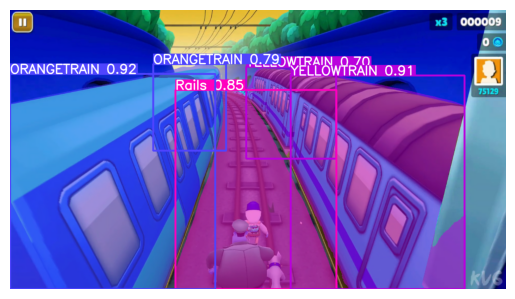

In [9]:
from ultralytics import YOLO
import os
import matplotlib.pyplot as plt

home       = os.path.expanduser("~")
weights    = f"{home}/models/jakes-loped/jakes-finder-mk1/1/weights.pt"
img_path   = f"{home}/SubwaySurfers/train_screenshots/frame_0000.jpg"

# load your segmentation model
model      = YOLO(weights)

# run inference (first / only batch)
results    = model(img_path, conf=0.5, iou=0.45)[0]

# plot it (masks + boxes + labels)
annotated  = results.plot()
plt.imshow(annotated)
plt.axis(False)
plt.show()




In [10]:
print("Have masks?", results.masks is not None)
print("Mask count:", len(results.masks.data))


Have masks? True
Mask count: 5



image 1/1 /Users/marcus/SubwaySurfers/train_screenshots/frame_0430.jpg: 864x1504 2 GREYTRAINs, 1 ORANGETRAIN, 3 RAMPs, 1 Rails, 1 YELLOWTRAIN, 416.1ms
Speed: 14.5ms preprocess, 416.1ms inference, 25.7ms postprocess per image at shape (1, 3, 864, 1504)
Got 8 polygons; first has shape: (410, 2)


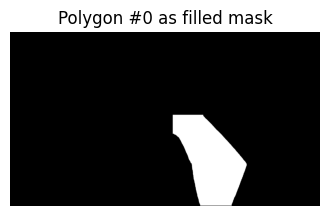

Bitmask array shape: (8, 864, 1504)


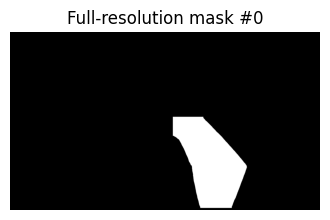

In [11]:
from ultralytics import YOLO
import os, numpy as np, cv2, matplotlib.pyplot as plt

home     = os.path.expanduser("~")
weights  = f"{home}/models/jakes-loped/jakes-finder-mk1/1/weights.pt"
img_path = f"{home}/SubwaySurfers/train_screenshots/frame_0430.jpg"

# 1) load + run seg model
model   = YOLO(weights)
results = model.predict(source=img_path, task="segment", conf=0.5, iou=0.45)[0]

# 2a) POLYGON VERTICES
polygons = [poly.astype(int) for poly in results.masks.xy]
print("Got", len(polygons), "polygons; first has shape:", polygons[0].shape)

# draw polygon #0 on a blank mask
h, w = results.orig_shape
poly0 = polygons[0].reshape(-1,1,2)  # (n_pts,1,2)
mask0 = np.zeros((h, w), dtype=np.uint8)
cv2.fillPoly(mask0, [poly0], color=1)

plt.figure(figsize=(4,4))
plt.imshow(mask0, cmap="gray")
plt.title("Polygon #0 as filled mask")
plt.axis(False)
plt.show()

# 2b) BINARY MASKS
# if you're on GPU, move to CPU; then convert to numpy:
bitmasks = results.masks.data.cpu().numpy()  # shape = (n_instances, H, W)
print("Bitmask array shape:", bitmasks.shape)

# show the first bitmask
plt.figure(figsize=(4,4))
plt.imshow(bitmasks[0], cmap="gray")
plt.title("Full-resolution mask #0")
plt.axis(False)
plt.show()



image 1/1 /Users/marcus/SubwaySurfers/train_screenshots/frame_0200.jpg: 864x1504 1 GREYTRAIN, 1 HIGHBARRIER1, 2 ORANGETRAINs, 3 Railss, 2 YELLOWTRAINs, 290.0ms
Speed: 8.8ms preprocess, 290.0ms inference, 18.3ms postprocess per image at shape (1, 3, 864, 1504)
[np.int64(1), np.int64(2), np.int64(6), np.int64(9), np.int64(11)]


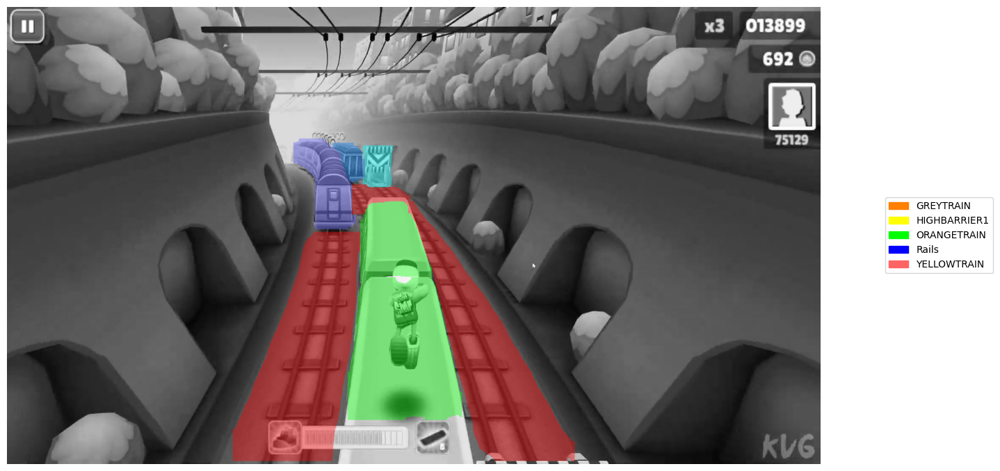


image 1/1 /Users/marcus/SubwaySurfers/train_screenshots/frame_0210.jpg: 864x1504 1 ORANGETRAIN, 1 Rails, 340.8ms
Speed: 9.2ms preprocess, 340.8ms inference, 4.8ms postprocess per image at shape (1, 3, 864, 1504)
[np.int64(6), np.int64(9)]


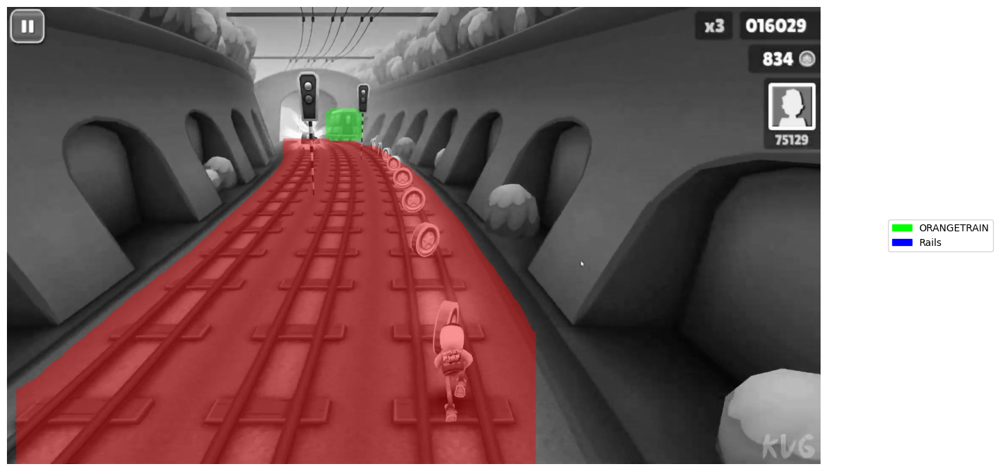


image 1/1 /Users/marcus/SubwaySurfers/train_screenshots/frame_0220.jpg: 864x1504 1 LOWBARRIER2, 1 ORANGETRAIN, 1 RAMP, 1 Rails, 284.9ms
Speed: 7.9ms preprocess, 284.9ms inference, 8.0ms postprocess per image at shape (1, 3, 864, 1504)
[np.int64(5), np.int64(6), np.int64(8), np.int64(9)]


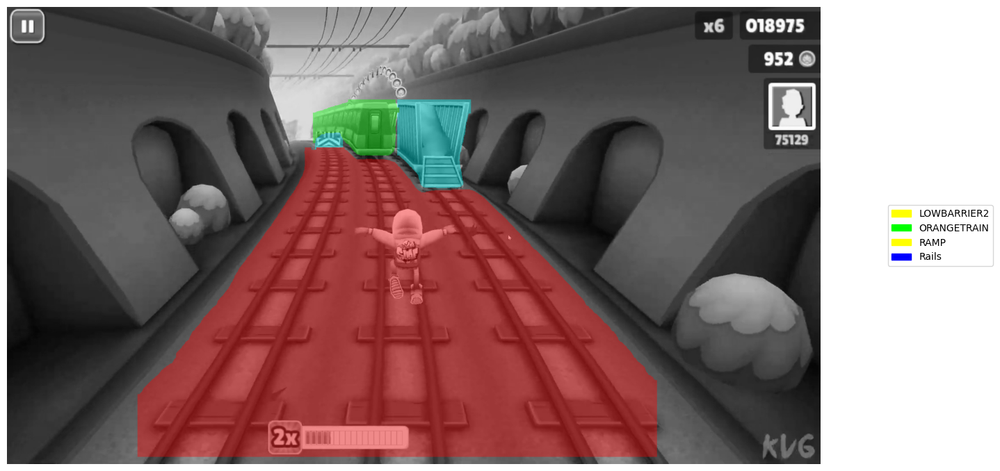


image 1/1 /Users/marcus/SubwaySurfers/train_screenshots/frame_0230.jpg: 864x1504 1 Rails, 3 YELLOWTRAINs, 257.6ms
Speed: 8.0ms preprocess, 257.6ms inference, 9.0ms postprocess per image at shape (1, 3, 864, 1504)
[np.int64(9), np.int64(11)]


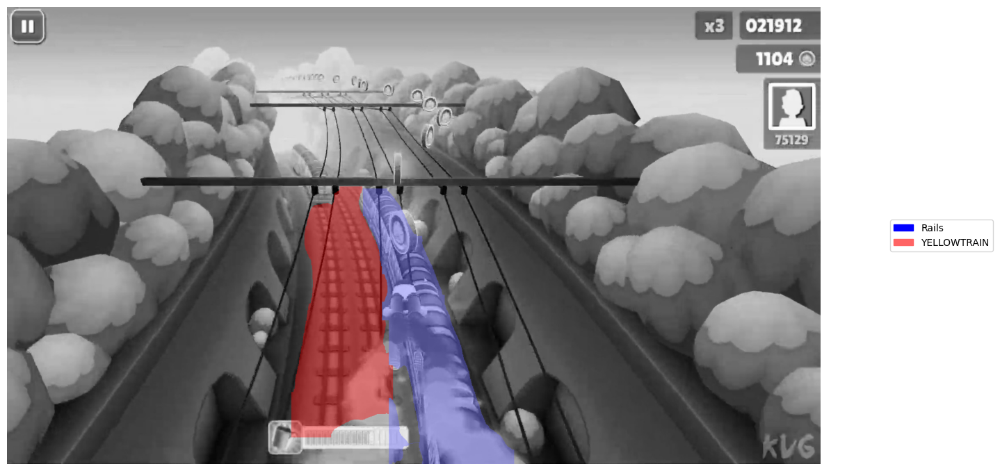


image 1/1 /Users/marcus/SubwaySurfers/train_screenshots/frame_0201.jpg: 864x1504 5 GREYTRAINs, 1 LOWBARRIER2, 2 Railss, 1 YELLOWTRAIN, 291.7ms
Speed: 7.5ms preprocess, 291.7ms inference, 14.9ms postprocess per image at shape (1, 3, 864, 1504)
[np.int64(1), np.int64(5), np.int64(9), np.int64(11)]


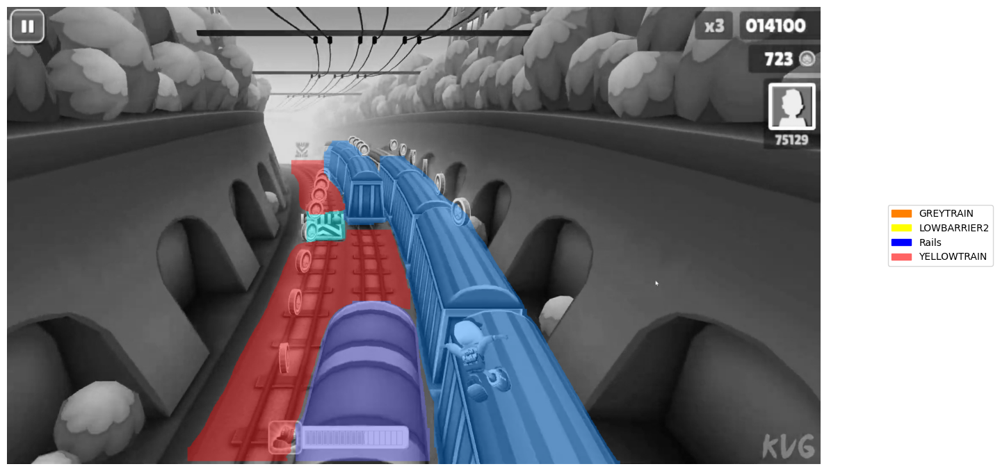


image 1/1 /Users/marcus/SubwaySurfers/train_screenshots/frame_0211.jpg: 864x1504 3 GREYTRAINs, 1 Pillar, 1 Rails, 255.9ms
Speed: 7.7ms preprocess, 255.9ms inference, 10.1ms postprocess per image at shape (1, 3, 864, 1504)
[np.int64(1), np.int64(7), np.int64(9)]


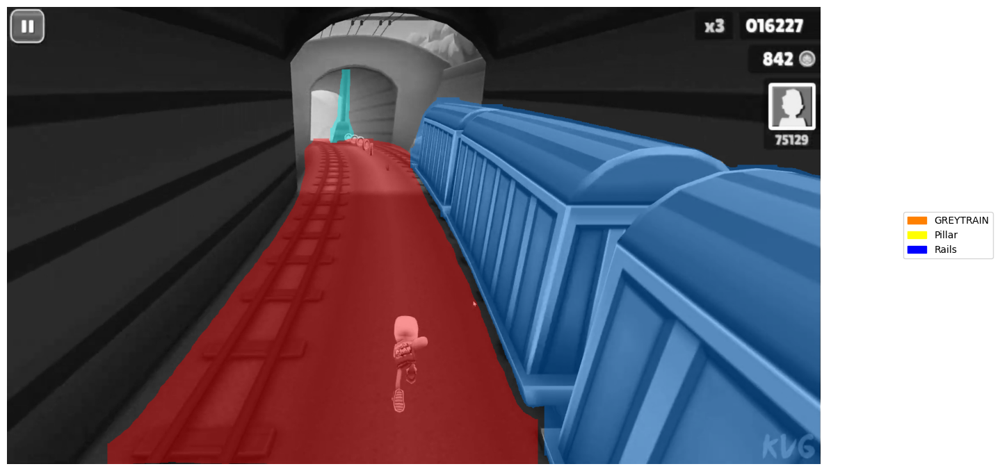


image 1/1 /Users/marcus/SubwaySurfers/train_screenshots/frame_0221.jpg: 864x1504 1 GREYTRAIN, 1 HIGHBARRIER1, 3 ORANGETRAINs, 1 RAMP, 2 Railss, 255.4ms
Speed: 7.9ms preprocess, 255.4ms inference, 16.4ms postprocess per image at shape (1, 3, 864, 1504)
[np.int64(1), np.int64(2), np.int64(6), np.int64(8), np.int64(9)]


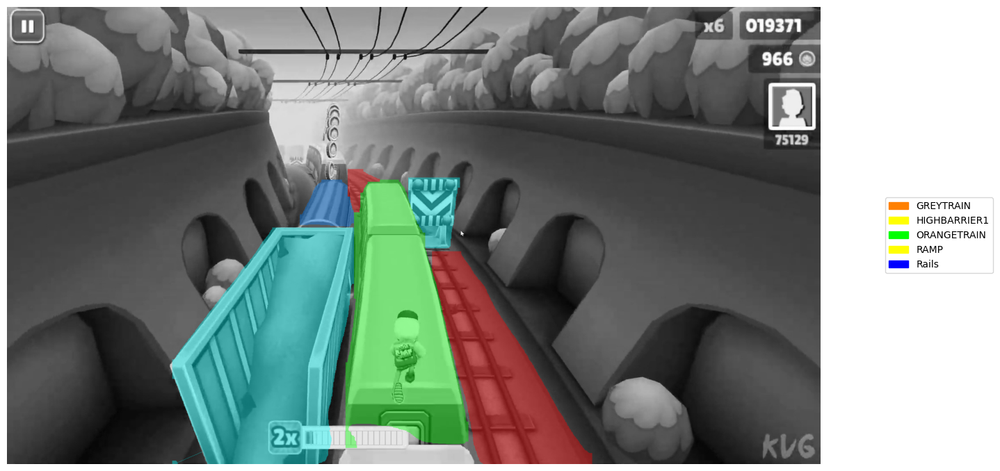


image 1/1 /Users/marcus/SubwaySurfers/train_screenshots/frame_0231.jpg: 864x1504 2 GREYTRAINs, 292.2ms
Speed: 7.2ms preprocess, 292.2ms inference, 5.8ms postprocess per image at shape (1, 3, 864, 1504)
[np.int64(1)]


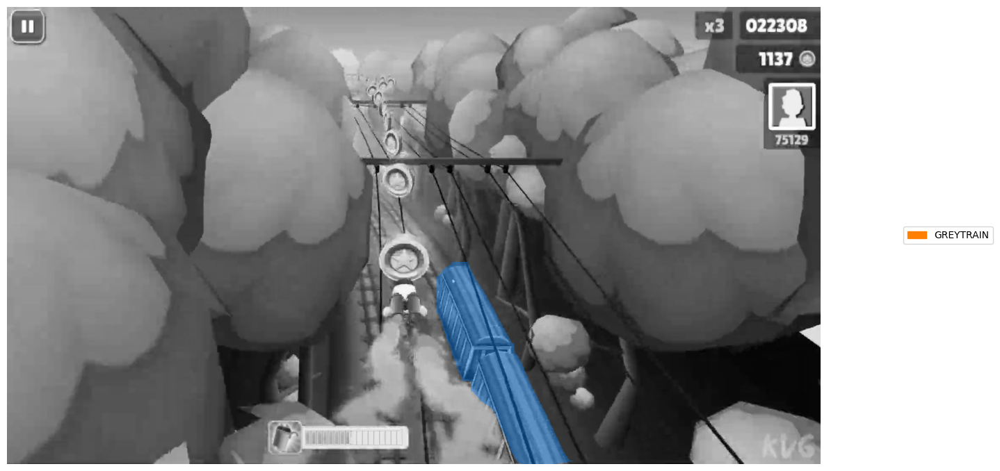


image 1/1 /Users/marcus/SubwaySurfers/train_screenshots/frame_0202.jpg: 864x1504 1 HIGHBARRIER1, 2 Pillars, 2 Railss, 294.3ms
Speed: 7.6ms preprocess, 294.3ms inference, 9.1ms postprocess per image at shape (1, 3, 864, 1504)
[np.int64(2), np.int64(7), np.int64(9)]


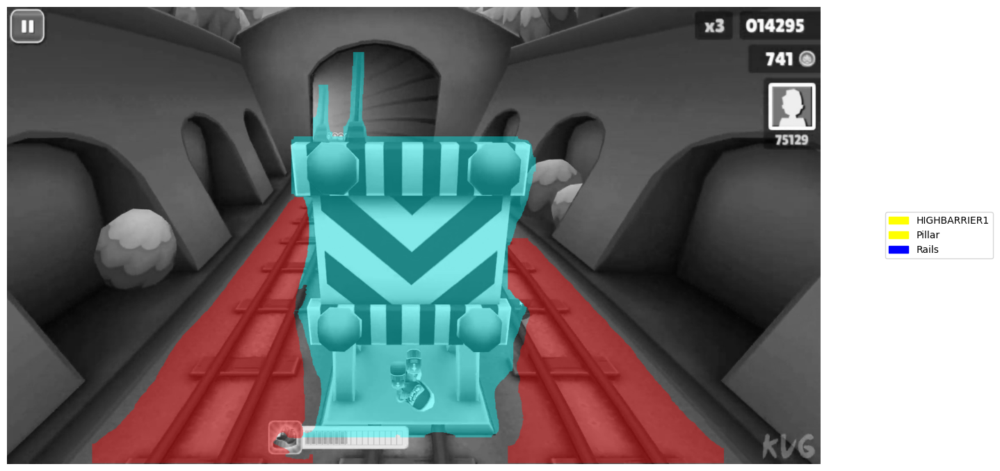


image 1/1 /Users/marcus/SubwaySurfers/train_screenshots/frame_0212.jpg: 864x1504 1 ORANGETRAIN, 1 Pillar, 1 Rails, 322.4ms
Speed: 7.2ms preprocess, 322.4ms inference, 7.7ms postprocess per image at shape (1, 3, 864, 1504)
[np.int64(6), np.int64(7), np.int64(9)]


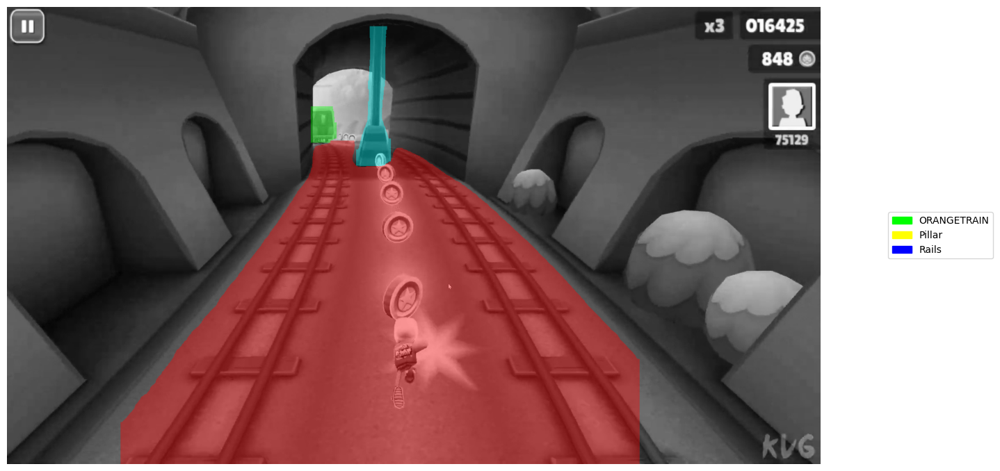


image 1/1 /Users/marcus/SubwaySurfers/train_screenshots/frame_0222.jpg: 864x1504 1 GREYTRAIN, 1 LOWBARRIER2, 2 ORANGETRAINs, 2 Railss, 296.1ms
Speed: 42.9ms preprocess, 296.1ms inference, 12.9ms postprocess per image at shape (1, 3, 864, 1504)
[np.int64(1), np.int64(5), np.int64(6), np.int64(9)]


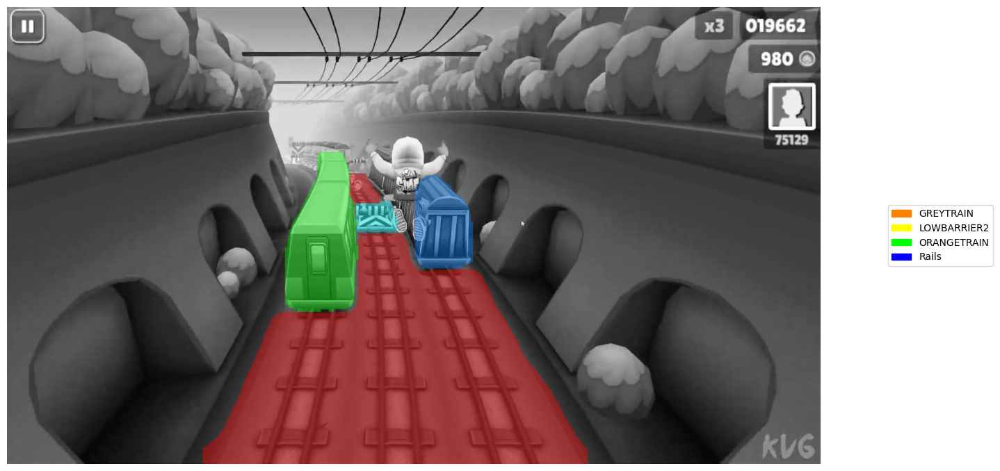


image 1/1 /Users/marcus/SubwaySurfers/train_screenshots/frame_0232.jpg: 864x1504 2 ORANGETRAINs, 1 Rails, 307.0ms
Speed: 7.7ms preprocess, 307.0ms inference, 7.7ms postprocess per image at shape (1, 3, 864, 1504)
[np.int64(6), np.int64(9)]


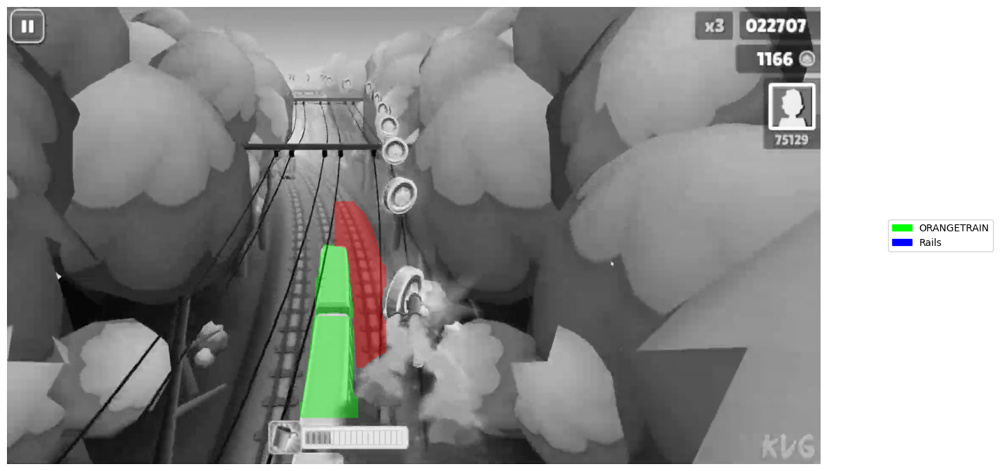


image 1/1 /Users/marcus/SubwaySurfers/train_screenshots/frame_0203.jpg: 864x1504 1 ORANGETRAIN, 2 Pillars, 1 Rails, 1 YELLOWTRAIN, 282.3ms
Speed: 7.9ms preprocess, 282.3ms inference, 9.3ms postprocess per image at shape (1, 3, 864, 1504)
[np.int64(6), np.int64(7), np.int64(9), np.int64(11)]


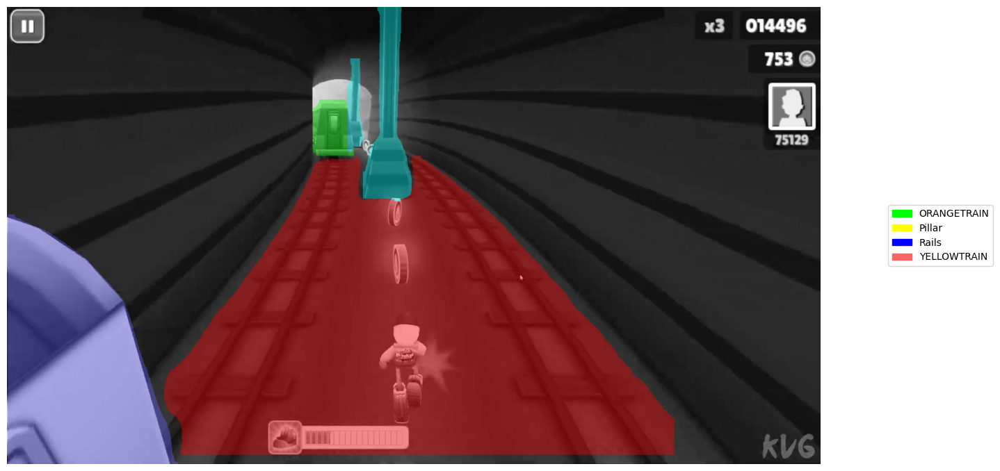


image 1/1 /Users/marcus/SubwaySurfers/train_screenshots/frame_0213.jpg: 864x1504 2 ORANGETRAINs, 1 RAMP, 1 Rails, 1 YELLOWTRAIN, 300.0ms
Speed: 8.1ms preprocess, 300.0ms inference, 10.8ms postprocess per image at shape (1, 3, 864, 1504)
[np.int64(6), np.int64(8), np.int64(9), np.int64(11)]


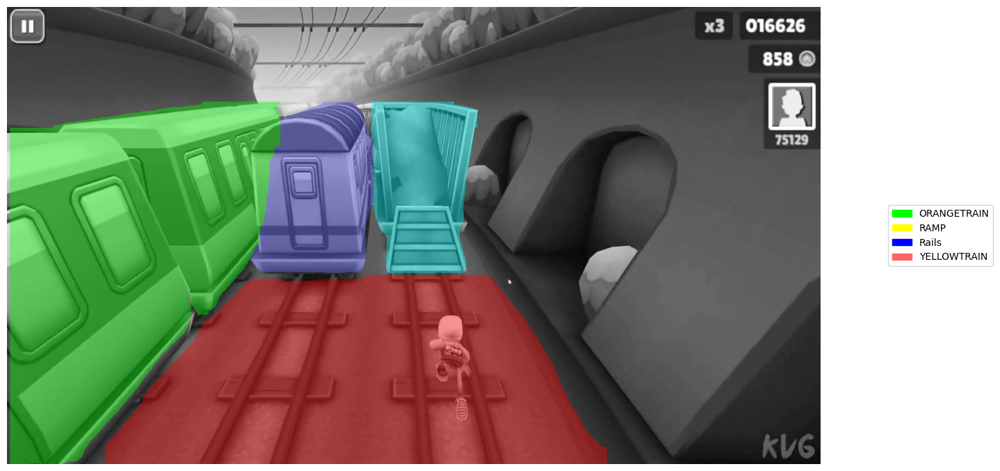


image 1/1 /Users/marcus/SubwaySurfers/train_screenshots/frame_0223.jpg: 864x1504 1 ORANGETRAIN, 1 Rails, 283.9ms
Speed: 7.9ms preprocess, 283.9ms inference, 4.5ms postprocess per image at shape (1, 3, 864, 1504)
[np.int64(6), np.int64(9)]


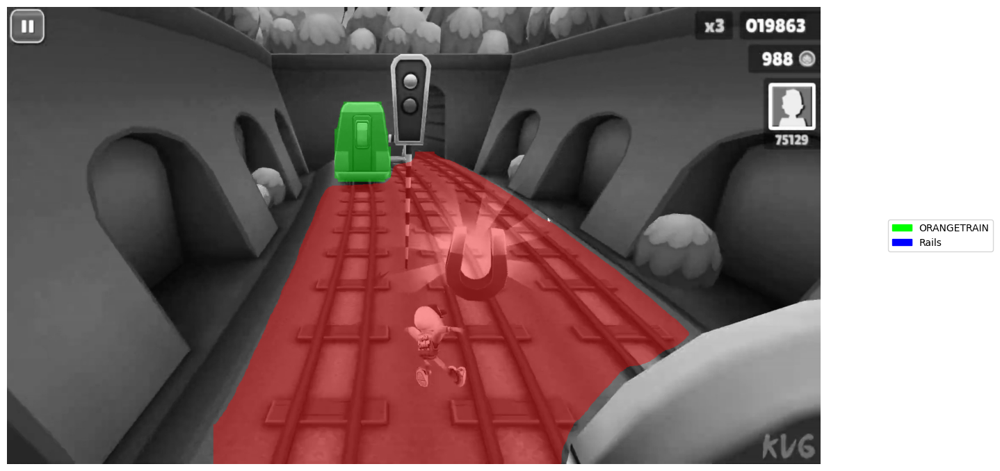


image 1/1 /Users/marcus/SubwaySurfers/train_screenshots/frame_0233.jpg: 864x1504 1 GREYTRAIN, 1 ORANGETRAIN, 1 Rails, 280.3ms
Speed: 8.5ms preprocess, 280.3ms inference, 6.3ms postprocess per image at shape (1, 3, 864, 1504)
[np.int64(1), np.int64(6), np.int64(9)]


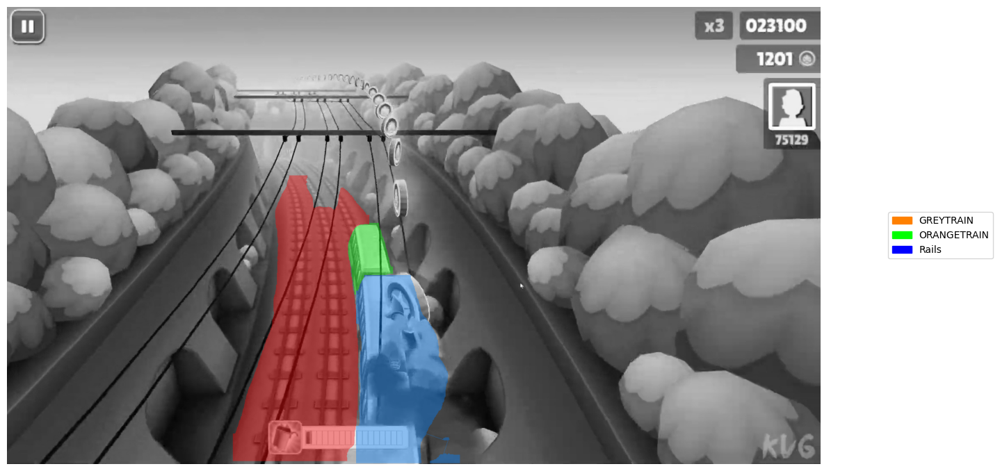


image 1/1 /Users/marcus/SubwaySurfers/train_screenshots/frame_0204.jpg: 864x1504 2 HIGHBARRIER1s, 1 LOWBARRIER2, 1 ORANGETRAIN, 1 Rails, 1 YELLOWTRAIN, 341.2ms
Speed: 7.1ms preprocess, 341.2ms inference, 9.2ms postprocess per image at shape (1, 3, 864, 1504)
[np.int64(2), np.int64(5), np.int64(6), np.int64(9), np.int64(11)]


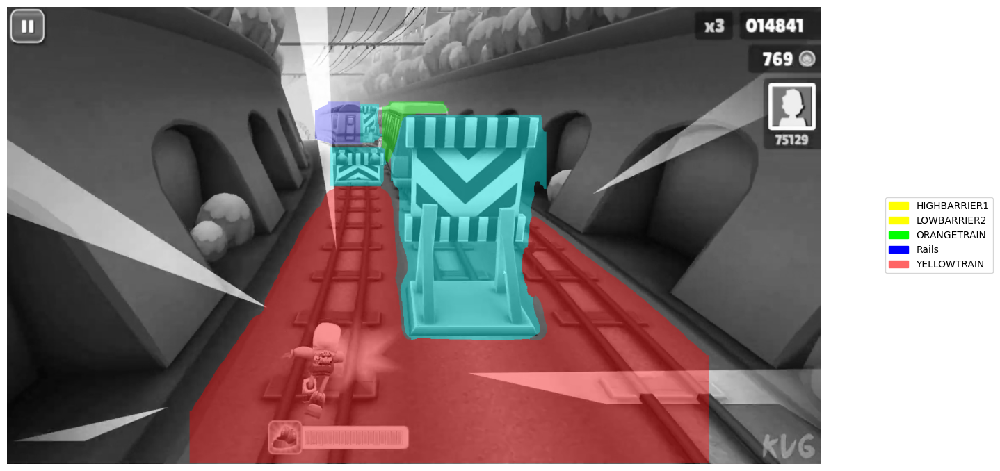


image 1/1 /Users/marcus/SubwaySurfers/train_screenshots/frame_0214.jpg: 864x1504 1 GREYTRAIN, 2 ORANGETRAINs, 1 RAMP, 1 Rails, 266.6ms
Speed: 8.4ms preprocess, 266.6ms inference, 9.3ms postprocess per image at shape (1, 3, 864, 1504)
[np.int64(1), np.int64(6), np.int64(8), np.int64(9)]


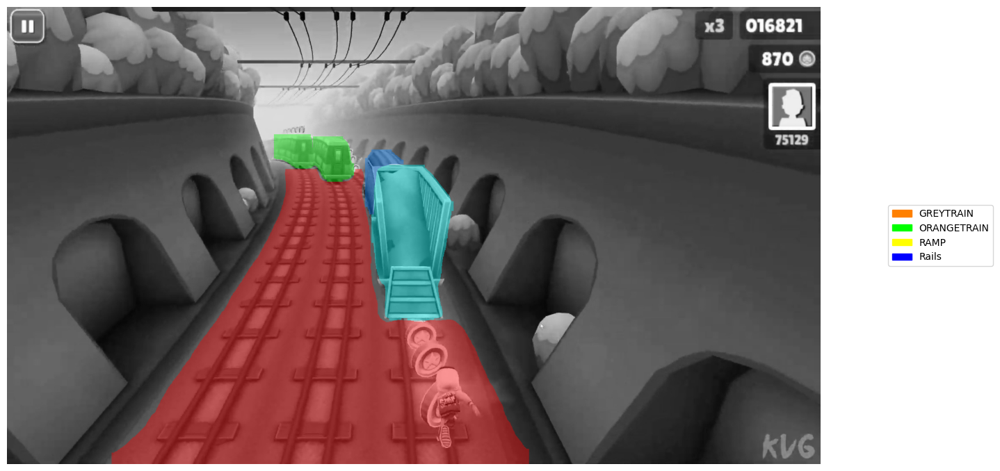


image 1/1 /Users/marcus/SubwaySurfers/train_screenshots/frame_0224.jpg: 864x1504 2 GREYTRAINs, 1 RAMP, 1 Rails, 256.8ms
Speed: 7.2ms preprocess, 256.8ms inference, 8.1ms postprocess per image at shape (1, 3, 864, 1504)
[np.int64(1), np.int64(8), np.int64(9)]


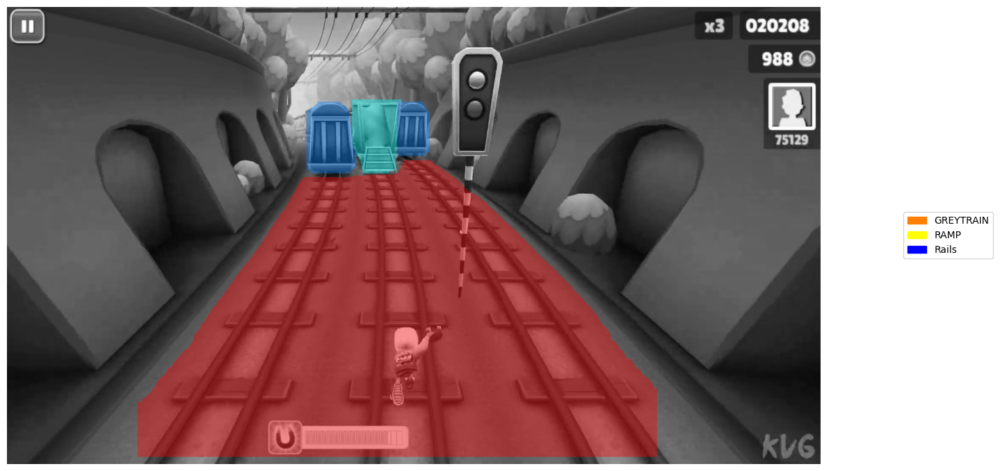


image 1/1 /Users/marcus/SubwaySurfers/train_screenshots/frame_0234.jpg: 864x1504 1 GREYTRAIN, 1 Rails, 395.7ms
Speed: 7.3ms preprocess, 395.7ms inference, 4.8ms postprocess per image at shape (1, 3, 864, 1504)
[np.int64(1), np.int64(9)]


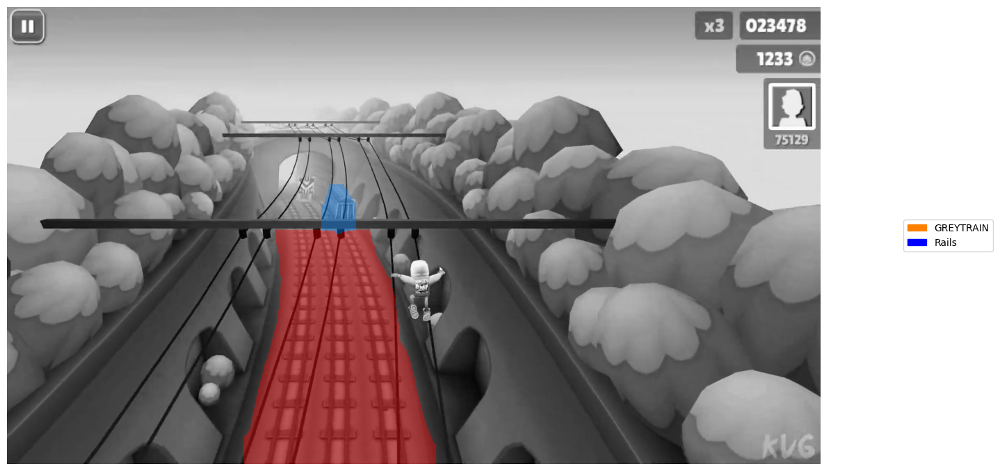


image 1/1 /Users/marcus/SubwaySurfers/train_screenshots/frame_0205.jpg: 864x1504 2 HIGHBARRIER1s, 1 LOWBARRIER2, 1 Rails, 317.5ms
Speed: 8.2ms preprocess, 317.5ms inference, 8.2ms postprocess per image at shape (1, 3, 864, 1504)
[np.int64(2), np.int64(5), np.int64(9)]


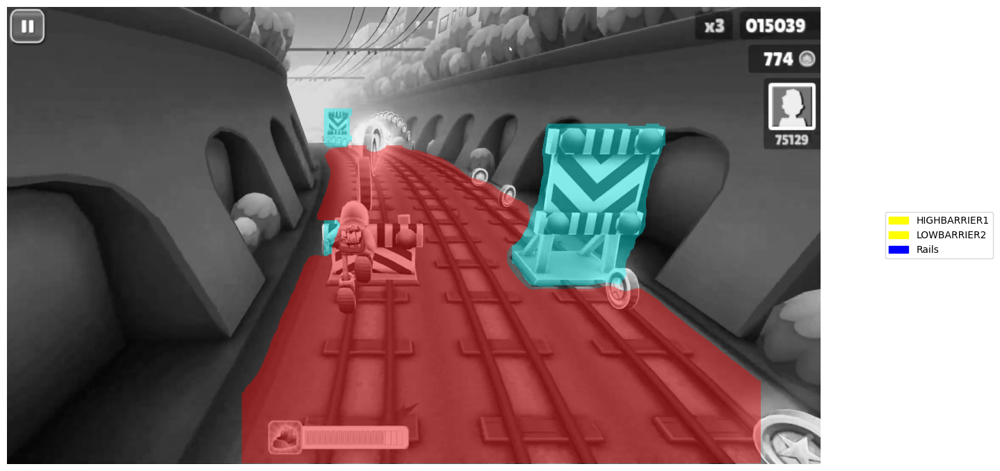


image 1/1 /Users/marcus/SubwaySurfers/train_screenshots/frame_0215.jpg: 864x1504 6 GREYTRAINs, 1 LOWBARRIER1, 2 LOWBARRIER2s, 3 Railss, 1 YELLOWTRAIN, 297.7ms
Speed: 8.4ms preprocess, 297.7ms inference, 25.6ms postprocess per image at shape (1, 3, 864, 1504)
[np.int64(1), np.int64(4), np.int64(5), np.int64(9), np.int64(11)]


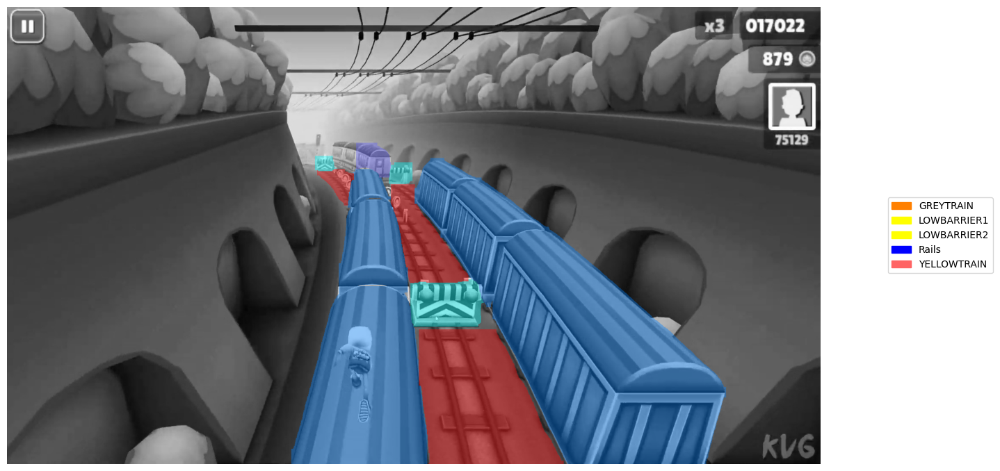


image 1/1 /Users/marcus/SubwaySurfers/train_screenshots/frame_0225.jpg: 864x1504 1 GREYTRAIN, 2 ORANGETRAINs, 1 RAMP, 1 Rails, 4 YELLOWTRAINs, 316.0ms
Speed: 7.3ms preprocess, 316.0ms inference, 18.7ms postprocess per image at shape (1, 3, 864, 1504)
[np.int64(1), np.int64(6), np.int64(8), np.int64(9), np.int64(11)]


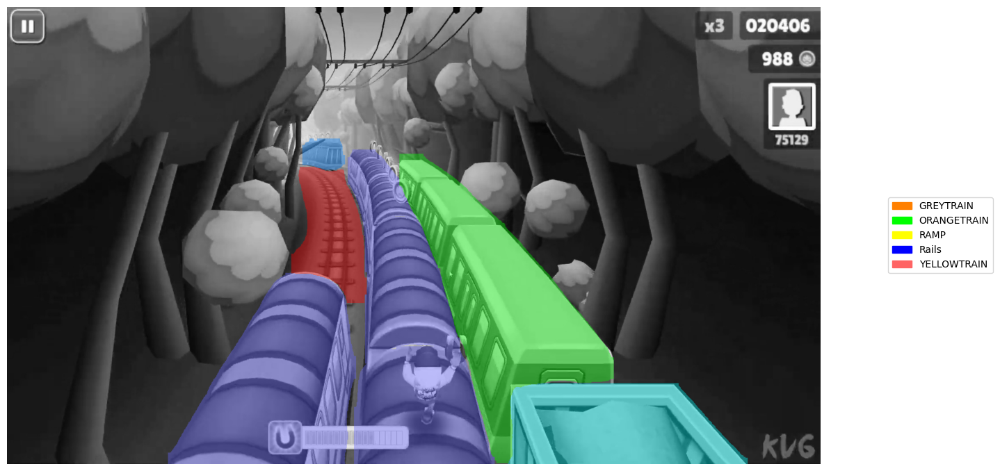


image 1/1 /Users/marcus/SubwaySurfers/train_screenshots/frame_0235.jpg: 864x1504 1 ORANGETRAIN, 1 Pillar, 1 Rails, 297.9ms
Speed: 9.2ms preprocess, 297.9ms inference, 6.1ms postprocess per image at shape (1, 3, 864, 1504)
[np.int64(6), np.int64(7), np.int64(9)]


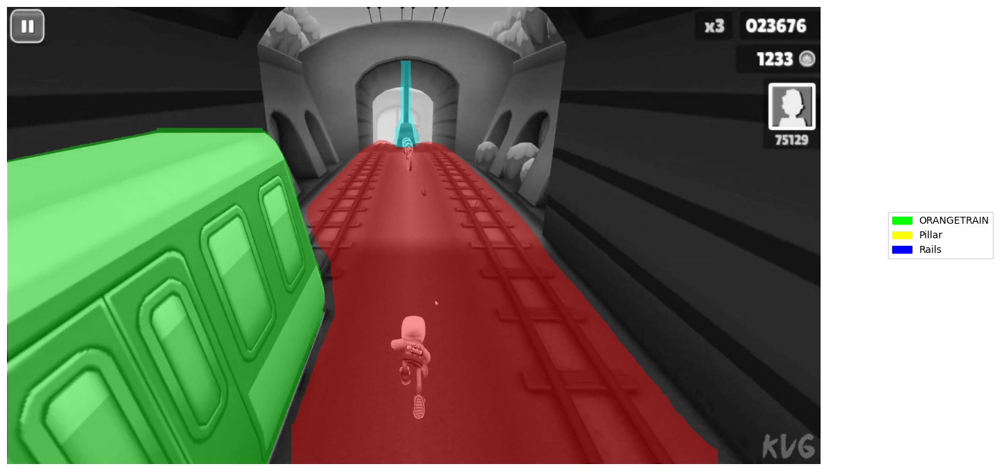


image 1/1 /Users/marcus/SubwaySurfers/train_screenshots/frame_0206.jpg: 864x1504 1 HIGHBARRIER1, 1 LOWBARRIER2, 1 Rails, 277.4ms
Speed: 7.3ms preprocess, 277.4ms inference, 6.7ms postprocess per image at shape (1, 3, 864, 1504)
[np.int64(2), np.int64(5), np.int64(9)]


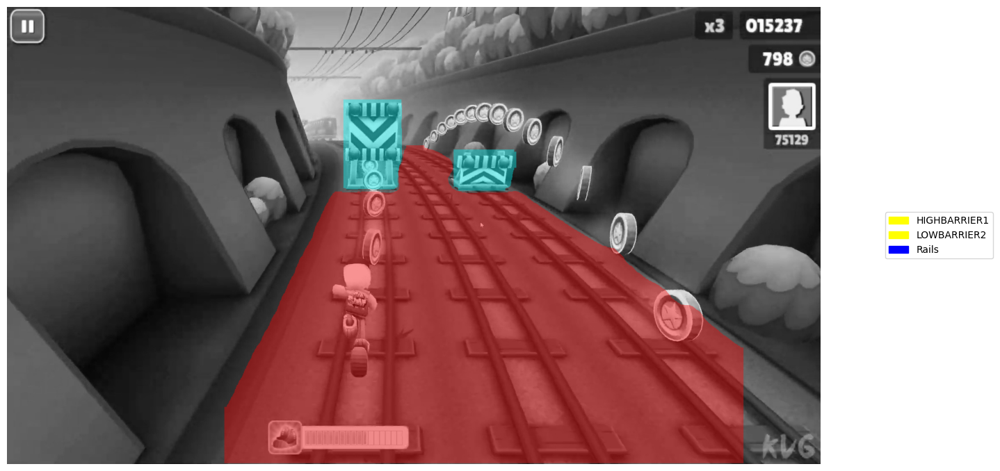


image 1/1 /Users/marcus/SubwaySurfers/train_screenshots/frame_0216.jpg: 864x1504 1 GREYTRAIN, 2 RAMPs, 3 Railss, 306.5ms
Speed: 7.7ms preprocess, 306.5ms inference, 11.1ms postprocess per image at shape (1, 3, 864, 1504)
[np.int64(1), np.int64(8), np.int64(9)]


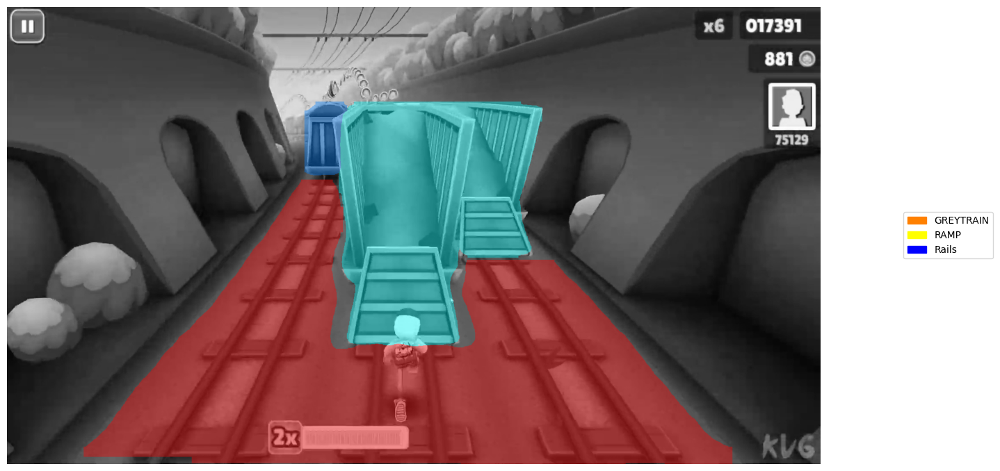


image 1/1 /Users/marcus/SubwaySurfers/train_screenshots/frame_0226.jpg: 864x1504 2 GREYTRAINs, 1 ORANGETRAIN, 1 Rails, 249.2ms
Speed: 7.2ms preprocess, 249.2ms inference, 7.9ms postprocess per image at shape (1, 3, 864, 1504)
[np.int64(1), np.int64(6), np.int64(9)]


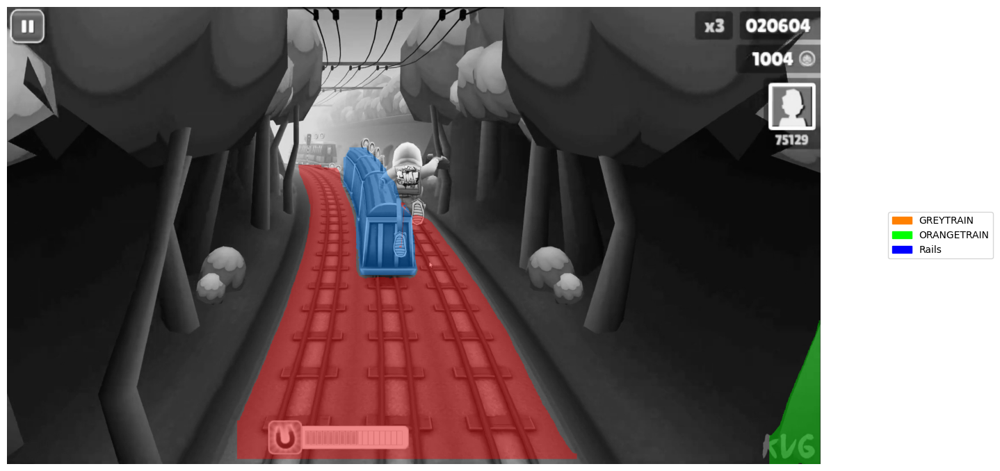


image 1/1 /Users/marcus/SubwaySurfers/train_screenshots/frame_0236.jpg: 864x1504 1 ORANGETRAIN, 1 Pillar, 1 Rails, 286.2ms
Speed: 7.1ms preprocess, 286.2ms inference, 6.7ms postprocess per image at shape (1, 3, 864, 1504)
[np.int64(6), np.int64(7), np.int64(9)]


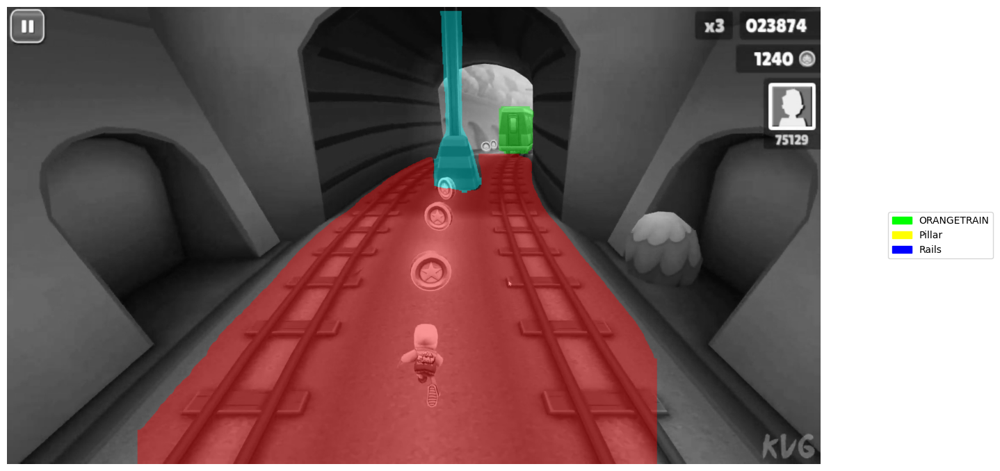


image 1/1 /Users/marcus/SubwaySurfers/train_screenshots/frame_0207.jpg: 864x1504 1 HIGHBARRIER1, 2 ORANGETRAINs, 1 Rails, 284.2ms
Speed: 7.0ms preprocess, 284.2ms inference, 8.1ms postprocess per image at shape (1, 3, 864, 1504)
[np.int64(2), np.int64(6), np.int64(9)]


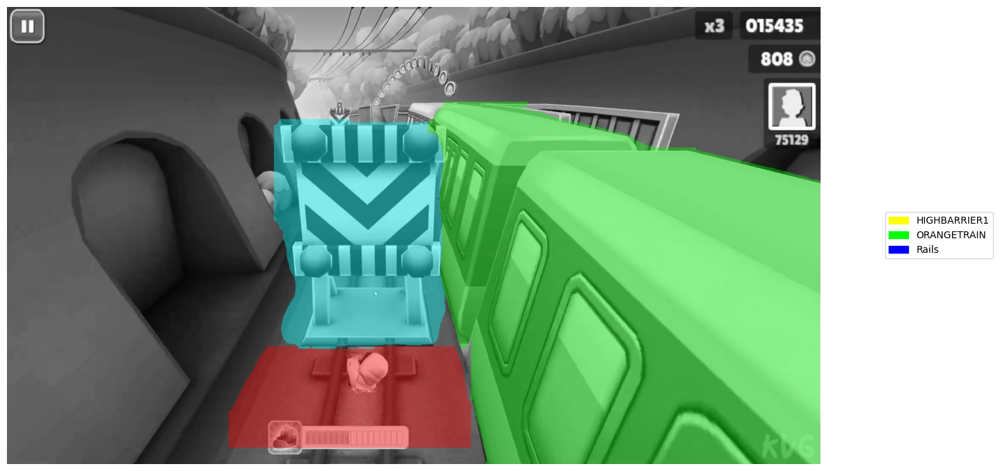


image 1/1 /Users/marcus/SubwaySurfers/train_screenshots/frame_0217.jpg: 864x1504 2 ORANGETRAINs, 2 RAMPs, 4 YELLOWTRAINs, 272.7ms
Speed: 7.4ms preprocess, 272.7ms inference, 15.6ms postprocess per image at shape (1, 3, 864, 1504)
[np.int64(6), np.int64(8), np.int64(11)]


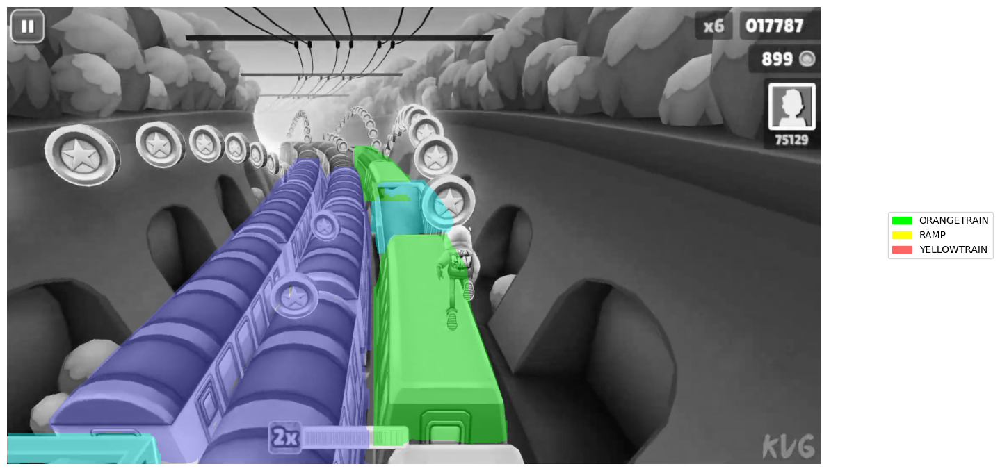


image 1/1 /Users/marcus/SubwaySurfers/train_screenshots/frame_0227.jpg: 864x1504 1 GREYTRAIN, 1 HIGHBARRIER1, 1 Rails, 1 YELLOWTRAIN, 286.3ms
Speed: 6.9ms preprocess, 286.3ms inference, 7.8ms postprocess per image at shape (1, 3, 864, 1504)
[np.int64(1), np.int64(2), np.int64(9), np.int64(11)]


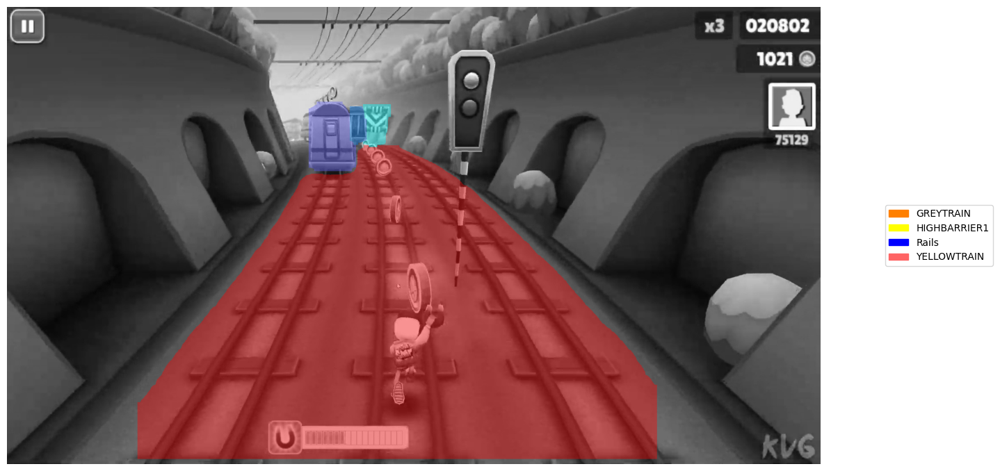


image 1/1 /Users/marcus/SubwaySurfers/train_screenshots/frame_0237.jpg: 864x1504 5 GREYTRAINs, 2 RAMPs, 1 Rails, 1 YELLOWTRAIN, 267.3ms
Speed: 7.8ms preprocess, 267.3ms inference, 13.6ms postprocess per image at shape (1, 3, 864, 1504)
[np.int64(1), np.int64(8), np.int64(9), np.int64(11)]


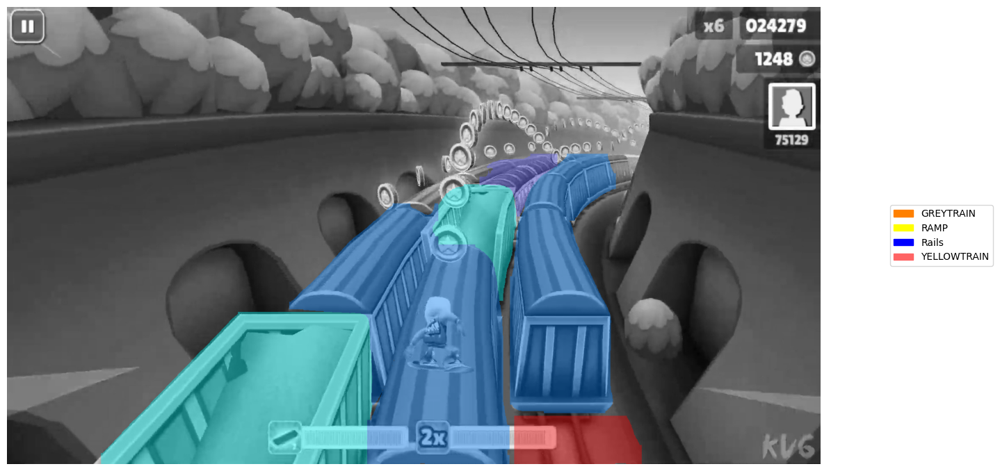


image 1/1 /Users/marcus/SubwaySurfers/train_screenshots/frame_0208.jpg: 864x1504 2 LOWBARRIER2s, 1 Rails, 3 YELLOWTRAINs, 276.7ms
Speed: 7.3ms preprocess, 276.7ms inference, 9.6ms postprocess per image at shape (1, 3, 864, 1504)
[np.int64(5), np.int64(9), np.int64(11)]


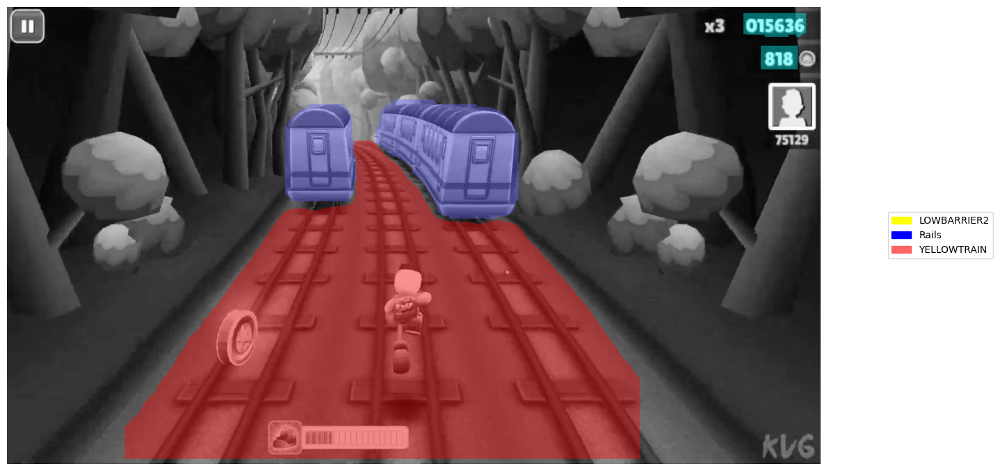


image 1/1 /Users/marcus/SubwaySurfers/train_screenshots/frame_0218.jpg: 864x1504 1 LOWBARRIER2, 1 Rails, 262.8ms
Speed: 7.7ms preprocess, 262.8ms inference, 4.7ms postprocess per image at shape (1, 3, 864, 1504)
[np.int64(5), np.int64(9)]


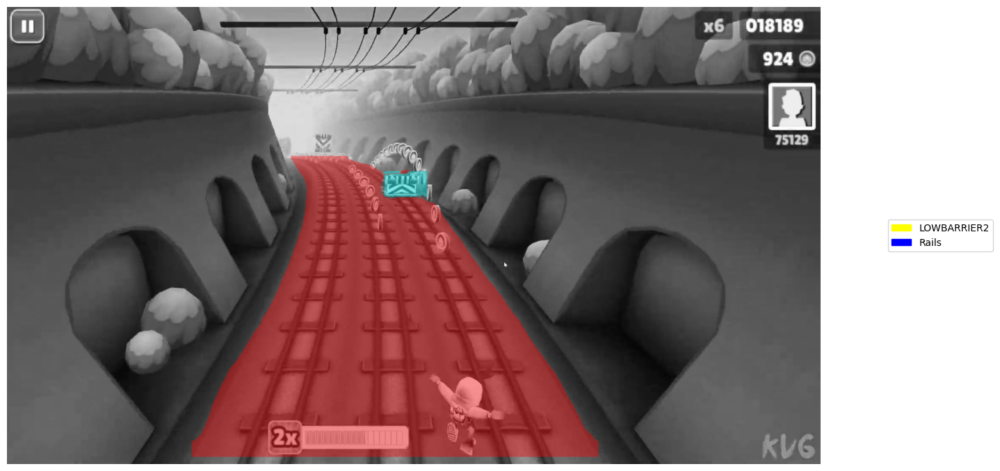


image 1/1 /Users/marcus/SubwaySurfers/train_screenshots/frame_0228.jpg: 864x1504 2 GREYTRAINs, 1 HIGHBARRIER1, 1 Rails, 1 YELLOWTRAIN, 267.5ms
Speed: 8.2ms preprocess, 267.5ms inference, 8.7ms postprocess per image at shape (1, 3, 864, 1504)
[np.int64(1), np.int64(2), np.int64(9), np.int64(11)]


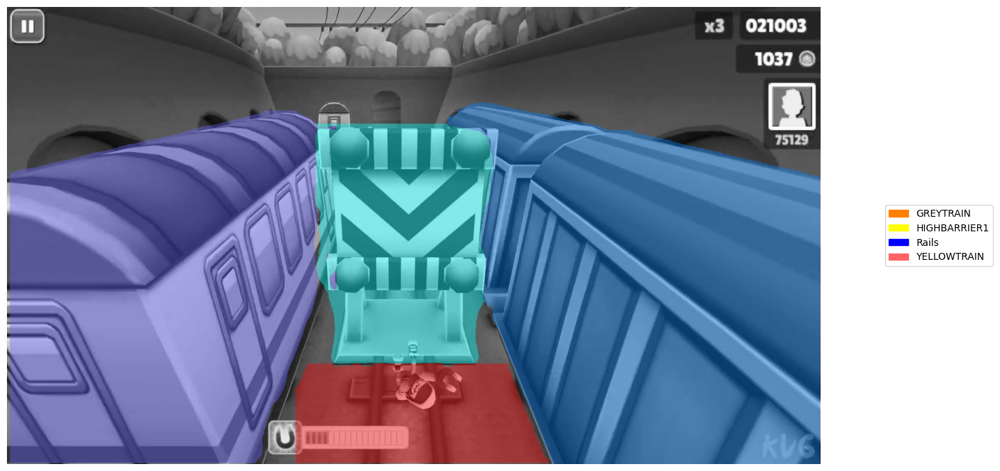


image 1/1 /Users/marcus/SubwaySurfers/train_screenshots/frame_0238.jpg: 864x1504 1 RAMP, 1 Rails, 3 YELLOWTRAINs, 284.3ms
Speed: 7.6ms preprocess, 284.3ms inference, 8.9ms postprocess per image at shape (1, 3, 864, 1504)
[np.int64(8), np.int64(9), np.int64(11)]


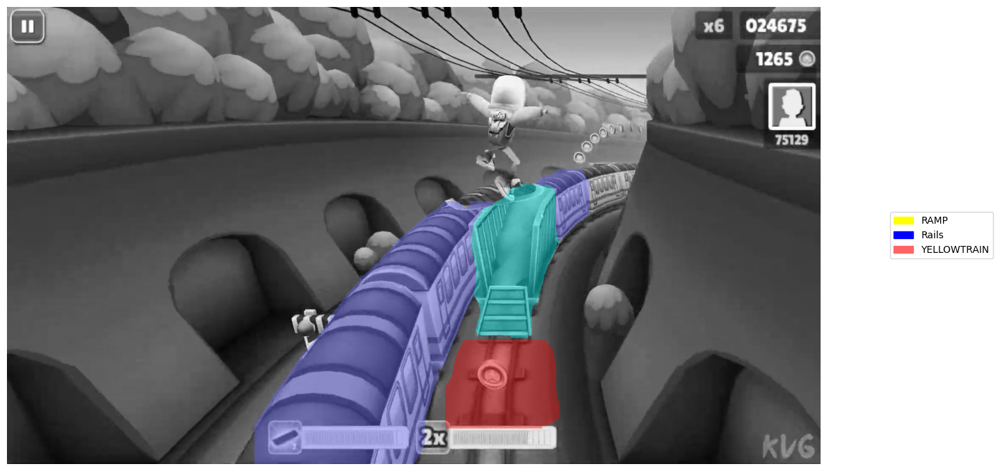


image 1/1 /Users/marcus/SubwaySurfers/train_screenshots/frame_0209.jpg: 864x1504 1 GREYTRAIN, 2 LOWBARRIER2s, 1 ORANGETRAIN, 1 Rails, 285.0ms
Speed: 8.0ms preprocess, 285.0ms inference, 10.1ms postprocess per image at shape (1, 3, 864, 1504)
[np.int64(1), np.int64(5), np.int64(6), np.int64(9)]


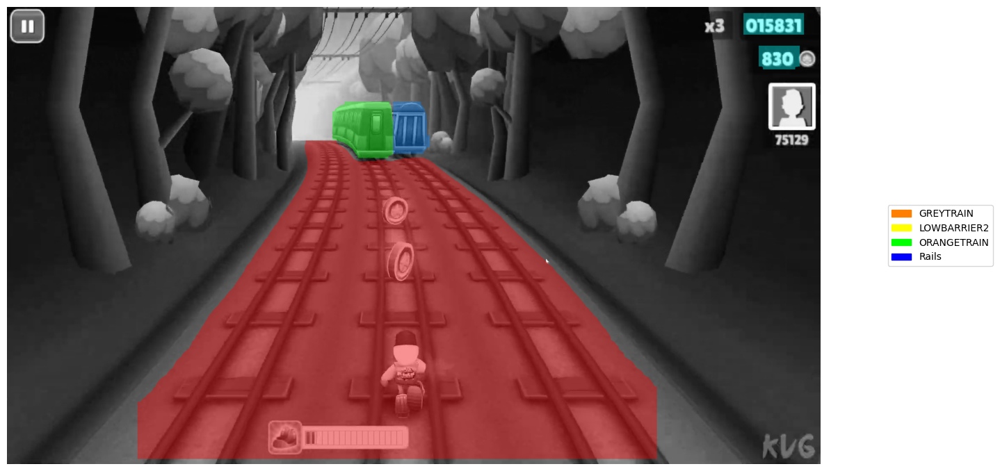


image 1/1 /Users/marcus/SubwaySurfers/train_screenshots/frame_0219.jpg: 864x1504 1 HIGHBARRIER1, 2 ORANGETRAINs, 1 Rails, 268.8ms
Speed: 7.8ms preprocess, 268.8ms inference, 7.6ms postprocess per image at shape (1, 3, 864, 1504)
[np.int64(2), np.int64(6), np.int64(9)]


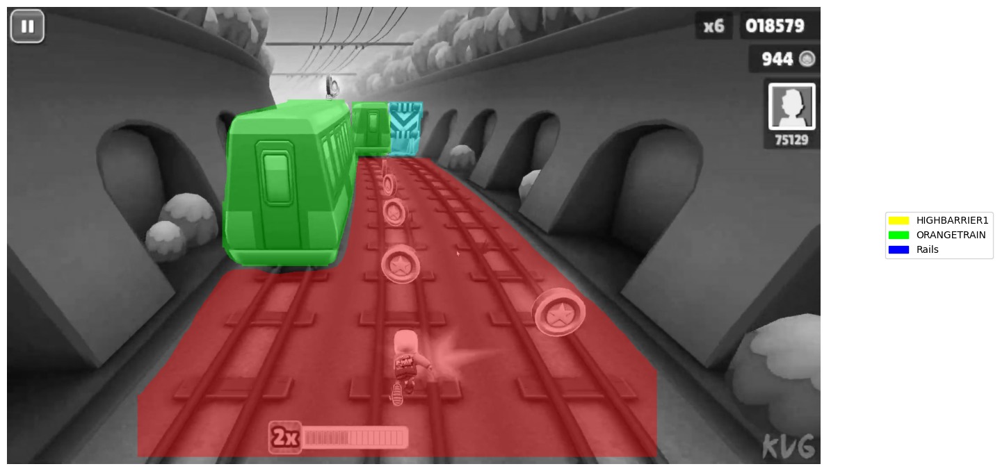


image 1/1 /Users/marcus/SubwaySurfers/train_screenshots/frame_0229.jpg: 864x1504 1 GREYTRAIN, 3 ORANGETRAINs, 1 Rails, 1 YELLOWTRAIN, 263.8ms
Speed: 10.0ms preprocess, 263.8ms inference, 9.1ms postprocess per image at shape (1, 3, 864, 1504)
[np.int64(1), np.int64(6), np.int64(9), np.int64(11)]


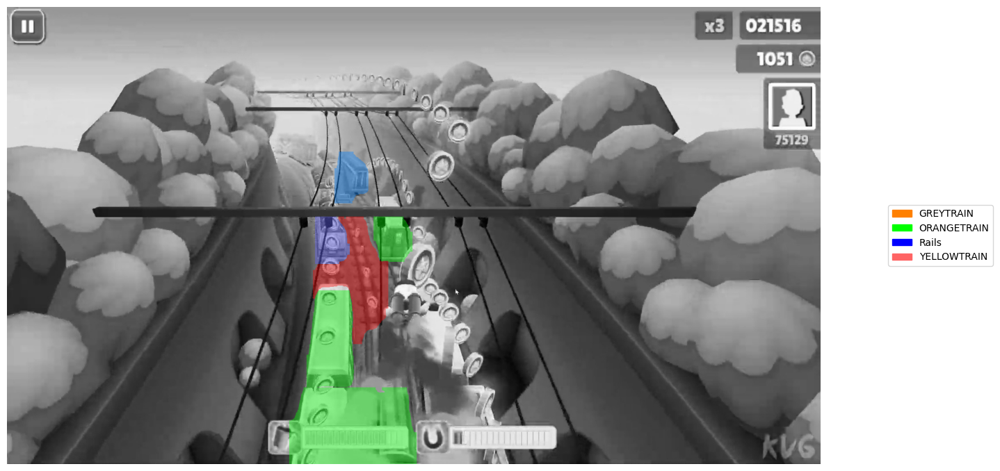


image 1/1 /Users/marcus/SubwaySurfers/train_screenshots/frame_0239.jpg: 864x1504 1 GREYTRAIN, 1 HIGHBARRIER1, 1 LOWBARRIER1, 2 ORANGETRAINs, 1 Rails, 3 YELLOWTRAINs, 271.1ms
Speed: 7.0ms preprocess, 271.1ms inference, 17.5ms postprocess per image at shape (1, 3, 864, 1504)
[np.int64(1), np.int64(2), np.int64(4), np.int64(6), np.int64(9), np.int64(11)]


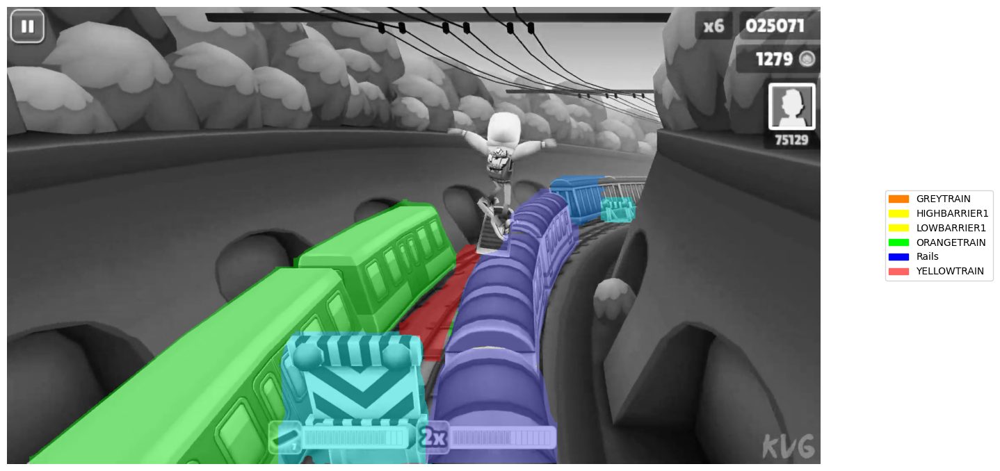

In [12]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
from ultralytics import YOLO

def cycle(j, i):
    # ————————————————————————————————
    # 1) SETUP
    # ————————————————————————————————
    home     = os.path.expanduser("~")
    weights  = f"{home}/models/jakes-loped/jakes-finder-mk1/1/weights.pt"
    img_path = f"{home}/SubwaySurfers/train_screenshots/frame_02{j}{i}.jpg" ##### ##### ##### ##### ##### ##### ##### ##### ##### #####
    
    # ————————————————————————————————
    # 2) RUN SEGMENTATION
    # ————————————————————————————————
    model   = YOLO(weights)
    results = model.predict(source=img_path, task="segment", conf=0.30, iou=0.45)[0]
    
    polygons  = results.masks.xy
    class_ids = results.boxes.cls.cpu().numpy().astype(int)
    names     = results.names  # dict: id → class name
    
    # ————————————————————————————————
    # 3) MAKE A GRAYSCALE BACKGROUND
    # ————————————————————————————————
    img_color = cv2.imread(img_path)
    img_gray  = cv2.cvtColor(img_color, cv2.COLOR_BGR2GRAY)
    bg_gray3  = cv2.cvtColor(img_gray, cv2.COLOR_GRAY2BGR)
    
    # ————————————————————————————————
    # 4) ASSIGN COLORS (CUSTOM RGB)
    # ————————————————————————————————
    unique_ids = sorted(set(class_ids))
    print(unique_ids)
    
    # <-- EDIT THIS dict with your preferred (R,G,B) for each class ID -->
    custom_colors = {
        1: (255, 128,   0),  # class 0 → orange
        6: (  0, 255,   0),  # class 1 → green
        9: (  0,   0, 255),  # class 2 → blue
        11: (255, 100,100,)
        # add more entries if you have more classes...
    }
    
    # build the final color_map, falling back to white if you forget an ID
    color_map = {
        cid: custom_colors.get(cid, (255, 255, 0))
        for cid in unique_ids
    }
    
    # ————————————————————————————————
    # 5) RENDER THE OVERLAY
    # ————————————————————————————————
    overlay = bg_gray3.copy()
    for poly, cid in zip(polygons, class_ids):
        pts = poly.astype(np.int32).reshape(-1, 1, 2)
        cv2.fillPoly(overlay, [pts], color_map[cid])
    
    alpha   = 0.4
    blended = cv2.addWeighted(overlay, alpha, bg_gray3, 1 - alpha, 0)
    
    # ————————————————————————————————
    # 6) PLOT + LEGEND
    # ————————————————————————————————
    fig, ax = plt.subplots(figsize=(12, 8))
    ax.imshow(cv2.cvtColor(blended, cv2.COLOR_BGR2RGB))
    ax.axis(False)
    
    patches = [
        Patch(color=np.array(color_map[cid]) / 255.0, label=names[cid])
        for cid in unique_ids
    ]
    fig.legend(handles=patches, loc="center right", bbox_to_anchor=(1.2, 0.5))
    plt.tight_layout()
    plt.show()


#Test for ranges
for i in range(10):
    for j in range(4):
        cycle(j, i)
